# Abordagem do Problema

# Medida de Desempenho

# Hipóteses

###### *Sistema com sobrecarga de peso*: aumento da corrente, sensor de vibração captaria

# Métricas

# Importando Bibliotecas

In [2]:
# Bibliotecas
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
import numpy as np

data = pd.read_csv('Dataset_SinaisEletricosVibracao_csv.xls')

In [3]:
# Visualizando os dados
data

,tempo_s,tipo_setup,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
0,0.00,0.0,0.44905,63.67320,1.43660,0.042740,21.869566,0.113479,0.175,91.738,0.406,12.474475,15.435837,4.223108,-50.647991,-63.189443,-47.864704,-59.629807,-73.010381,-49.583755
1,0.08,0.0,0.44610,69.40320,1.67860,0.048945,1.600020,0.854342,0.227,7.359,3.843,20.070610,13.335535,16.966677,-50.696943,-63.340003,-48.313132,-59.591150,-72.360239,-49.473893
2,0.16,0.0,0.45175,69.11385,1.39950,0.042337,5.220348,0.284000,0.207,24.185,1.395,19.087723,7.345771,11.032327,-47.724322,-62.837371,-48.384219,-55.194912,-63.127903,-48.083630
3,0.24,0.0,0.43510,68.85665,1.39705,0.063224,3.437546,0.219507,0.228,16.040,0.973,6.869051,19.849528,9.136137,-47.652608,-62.613368,-48.768793,-55.275822,-63.310116,-47.937933
4,0.32,0.0,0.45055,70.52860,1.43375,0.048497,1.240032,0.111967,0.222,4.394,0.425,20.205840,2.325535,2.818658,-47.019446,-61.314274,-49.016646,-54.665312,-60.825200,-47.886619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,39.68,4.0,0.46575,68.42795,1.59235,0.042147,8.058820,0.900427,0.199,37.403,4.276,5.486469,22.266532,21.582764,-33.195195,-52.502279,-41.610532,-37.874381,-49.147213,-42.417970
2501,39.76,4.0,0.44705,62.32815,1.57365,0.068987,15.876663,0.904702,0.231,62.159,4.218,5.237910,11.518238,21.593782,-33.360763,-52.868492,-42.054637,-37.995903,-49.251871,-42.703237
2502,39.84,4.0,0.47110,76.04075,1.77275,0.045194,34.799709,1.657858,0.191,184.906,7.810,9.874863,20.660427,6.075266,-33.497896,-53.300911,-42.289221,-38.129107,-48.947030,-42.896321
2503,39.92,4.0,0.47745,72.86850,1.39700,0.043033,0.826486,0.131019,0.194,2.893,0.383,21.320253,2.327027,1.904577,-33.581380,-53.601503,-42.527074,-38.258422,-48.618126,-42.420583


### Exploração dos Dados

In [4]:
# Estatísticas descritivas - geral
data.describe()

,tempo_s,tipo_setup,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
count,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000
mean,20.000000,2.000000,0.467173,71.095485,1.510273,0.062549,10.030840,0.495564,0.280475,46.371912,2.225988,12.050777,14.937885,11.168255,-39.983011,-54.772230,-47.535366,-45.145129,-55.583079,-46.578764
std,11.572386,1.414496,0.037798,6.369966,0.138248,0.057536,11.105669,0.375317,0.269268,52.036291,1.767510,5.230828,6.931692,7.207961,4.949400,9.313107,5.857693,6.269441,9.072283,3.855181
min,0.000000,0.000000,0.261900,38.470250,0.810650,0.001372,0.543396,0.063909,0.005000,1.893000,0.244000,1.660392,1.325033,1.187931,-50.696943,-71.520216,-58.985078,-65.271484,-73.010381,-54.985263
25%,10.000000,1.000000,0.445700,67.307950,1.419950,0.041017,2.689081,0.154070,0.183000,12.789000,0.596000,7.971048,9.554414,4.030760,-43.902336,-59.541521,-52.053099,-50.245276,-63.067057,-49.493122
50%,20.000000,2.000000,0.456750,69.612150,1.479250,0.056569,8.407893,0.377251,0.244000,38.618000,1.745000,10.701860,16.355427,9.754281,-41.943547,-54.967319,-47.868026,-48.353184,-59.158229,-47.233461
75%,30.000000,3.000000,0.472450,73.029150,1.590750,0.070714,12.983316,0.879553,0.302000,58.301000,4.108000,15.927991,21.599938,18.540216,-34.647596,-50.619857,-41.947513,-37.978948,-49.267334,-42.830915
max,40.000000,4.000000,0.625950,96.651550,2.118200,0.860274,149.491667,2.007972,3.881000,672.213000,10.687000,22.979158,22.994930,22.794465,-31.993773,-37.605394,-36.684861,-35.173001,-37.765710,-38.495491


In [5]:
# Conferindo balanceamento dos atributos alvos  (classes)
print(data['tipo_setup'].value_counts())


# variável target: tipo_setup

tipo_setup
0.0    501
1.0    501
2.0    501
3.0    501
4.0    501
Name: count, dtype: int64


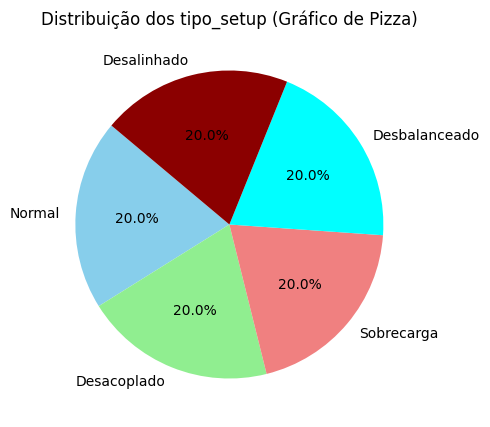

In [6]:
# Gráfico de pizza do tipo_setup


# Mapeamento dos valores numéricos para as descrições
labels = {
    0.0: 'Normal',
    1.0: 'Desacoplado',
    2.0: 'Sobrecarga',
    3.0: 'Desbalanceado',
    4.0: 'Desalinhado'
}

# Substituindo os números pelos rótulos descritivos
class_distribution = data['tipo_setup'].value_counts()
class_labels = [labels[val] for val in class_distribution.index]

# Gerando o gráfico de pizza
plt.figure(figsize=(5,5))
plt.pie(class_distribution, labels=class_labels, autopct='%1.1f%%', colors=['skyblue', 'lightgreen', 'lightcoral', 'cyan', 'darkred'], startangle=140)
plt.title('Distribuição dos tipo_setup (Gráfico de Pizza)')
plt.show()

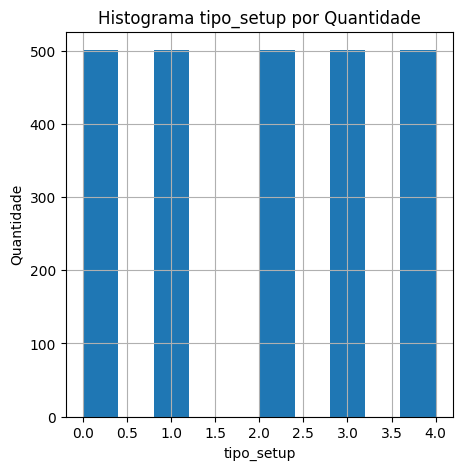

In [7]:
# Histogramas para conferir balanceamento tipo_setup
plt.figure(figsize=(5,5))
data.tipo_setup.hist()

# Adicionando título e rótulos aos eixos
plt.title("Histograma tipo_setup por Quantidade")
plt.xlabel("tipo_setup")
plt.ylabel("Quantidade")
plt.show()


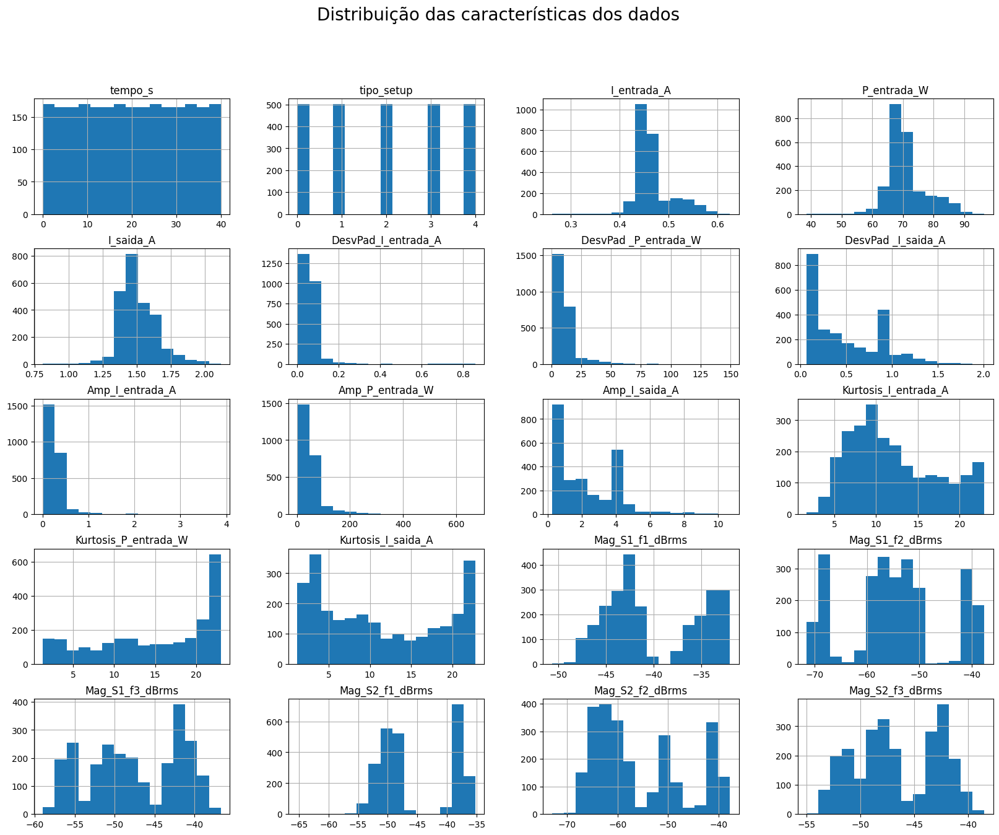

In [8]:
# Histogramas para distribuição das características
data.hist(figsize=(20,15), bins=15)
plt.suptitle('Distribuição das características dos dados', fontsize=20)
plt.show()

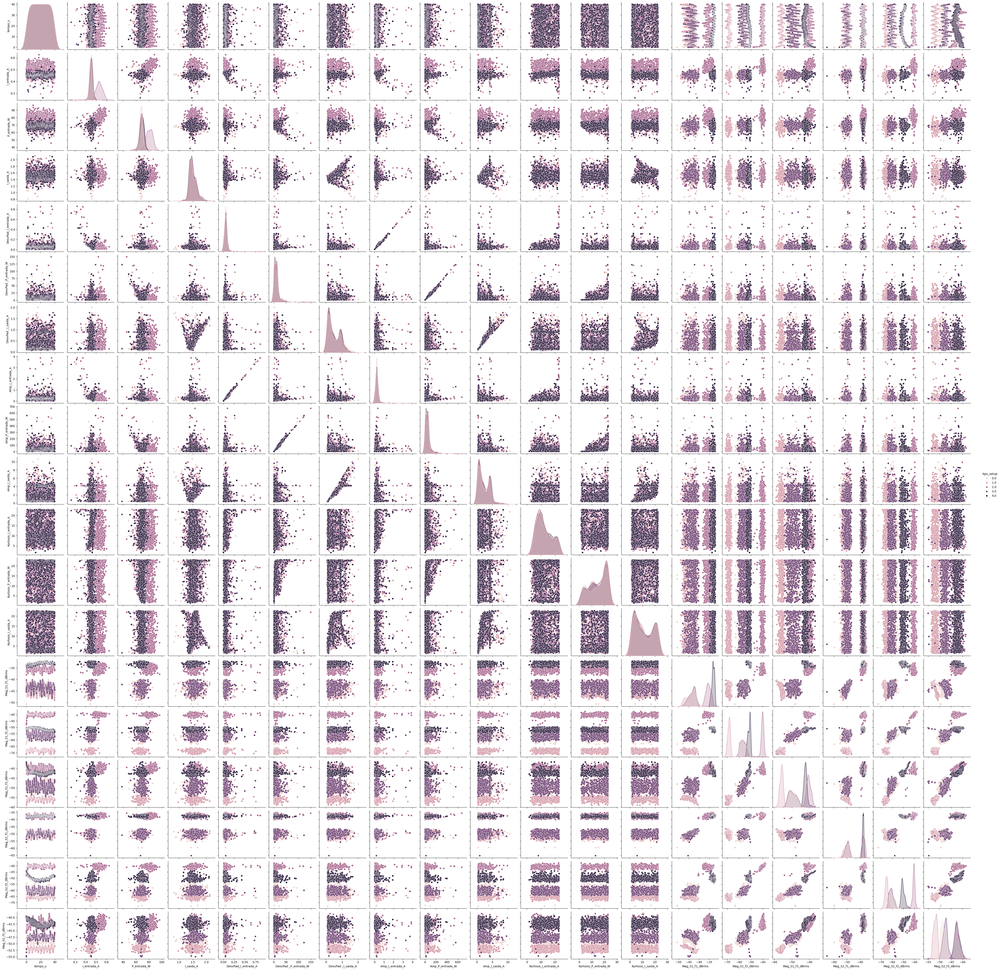

In [9]:
# Pairplot (gráfico de pares) de pares para coluna tipo_setup
sns.pairplot(data, hue='tipo_setup')
plt.show()


###### Mediante aos gráficos acima plotados, é notório que algumas das distribuições registradas apresentam uma correlação significante não correlacionadas, como quando observados no gráfico em Mag_S2_f3_dBrms e Mag_S1_f1_dBrms

In [10]:
# # Boxplot para visualização de outliers

# # Boxplot individual de cada atributo vs classe
# plt.figure(figsize=(5, 5))
# for i, column in enumerate(data.columns[:-1]):
#     plt.subplot(2, 2, i+1)
#     sns.boxplot(x='tipo_setup', y=column, data=data, showmeans=True)
#     plt.title(f'Boxplot de {column} por tipo_setup')
# plt.tight_layout()
# plt.show()

C:\Users\cleil\AppData\Local\Temp\ipykernel_9704\3893728300.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='tipo_setup', y='Mag_S2_f3_dBrms', data=data, palette='muted')


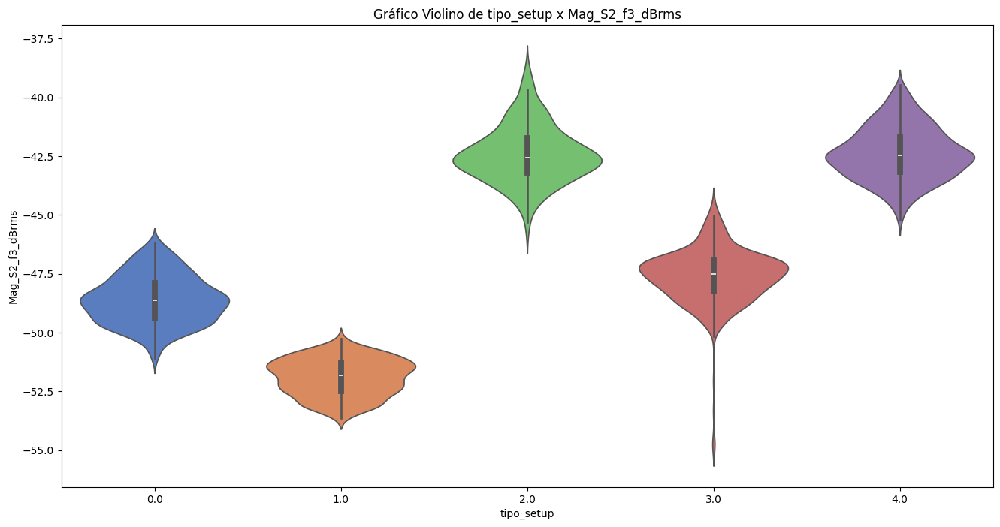

In [11]:
# Mapeamento dos valores numéricos para as descrições
plt.figure(figsize=(16, 8))
sns.violinplot(x='tipo_setup', y='Mag_S2_f3_dBrms', data=data, palette='muted')
plt.title('Gráfico Violino de tipo_setup x Mag_S2_f3_dBrms')
plt.show()

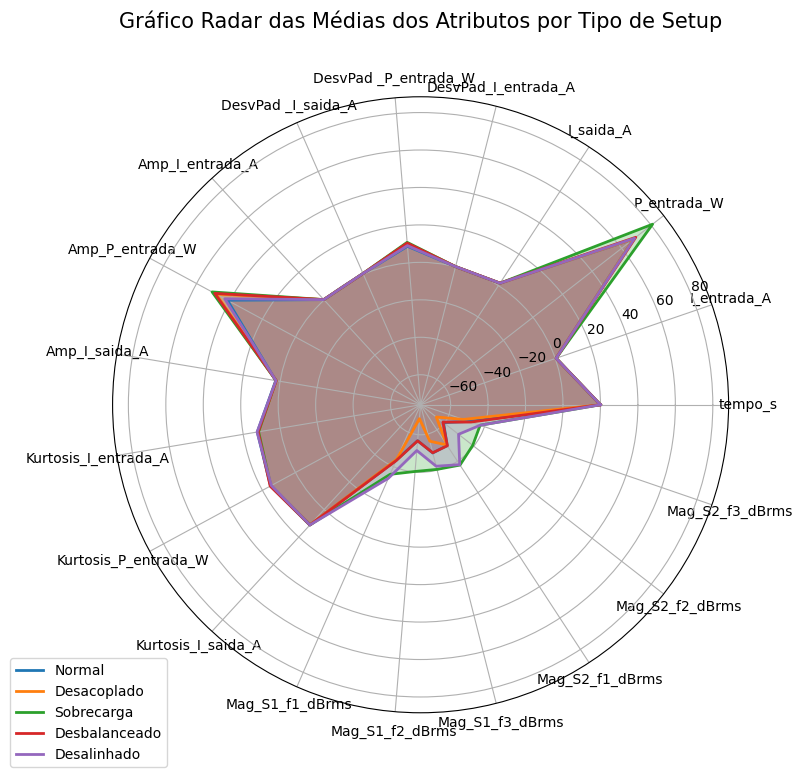

In [12]:
# 6. Gráfico Radar com legendas para os tipos de setup

# Importando bibliotecas adicionais para o gráfico radar
from math import pi

# Mapeamento dos valores numéricos para as descrições
labels = {
    0.0: 'Normal',
    1.0: 'Desacoplado',
    2.0: 'Sobrecarga',
    3.0: 'Desbalanceado',
    4.0: 'Desalinhado'
}

# Normalizando as médias para plotar no gráfico radar
df_means = data.groupby('tipo_setup').mean(numeric_only=True)

# Renomeando os índices do DataFrame com base nos rótulos
df_means.index = df_means.index.map(labels)

# Função para criar o gráfico radar
def plot_radar(df, title):
    # Número de variáveis
    categories = list(df.columns)
    N = len(categories)

    # Ângulo para cada eixo no gráfico radar
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Inicializando o gráfico
    fig, ax = plt.subplots(figsize=(12, 8), subplot_kw=dict(polar=True))

    # Loop através de cada tipo_setup
    for index, row in df.iterrows():
        values = row.tolist()
        values += values[:1]  # Fechando o círculo
        ax.plot(angles, values, linewidth=2, linestyle='solid', label=index)
        ax.fill(angles, values, alpha=0.25)

    # Adicionando os rótulos e título
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories)
    ax.set_title(title, size=15, color='black', y=1.1)

    # Exibindo a legenda
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    plt.show()

# Chamando a função para plotar o gráfico radar
plot_radar(df_means, "Gráfico Radar das Médias dos Atributos por Tipo de Setup")


### Pré-processamento dos dados

In [13]:
data

,tempo_s,tipo_setup,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
0,0.00,0.0,0.44905,63.67320,1.43660,0.042740,21.869566,0.113479,0.175,91.738,0.406,12.474475,15.435837,4.223108,-50.647991,-63.189443,-47.864704,-59.629807,-73.010381,-49.583755
1,0.08,0.0,0.44610,69.40320,1.67860,0.048945,1.600020,0.854342,0.227,7.359,3.843,20.070610,13.335535,16.966677,-50.696943,-63.340003,-48.313132,-59.591150,-72.360239,-49.473893
2,0.16,0.0,0.45175,69.11385,1.39950,0.042337,5.220348,0.284000,0.207,24.185,1.395,19.087723,7.345771,11.032327,-47.724322,-62.837371,-48.384219,-55.194912,-63.127903,-48.083630
3,0.24,0.0,0.43510,68.85665,1.39705,0.063224,3.437546,0.219507,0.228,16.040,0.973,6.869051,19.849528,9.136137,-47.652608,-62.613368,-48.768793,-55.275822,-63.310116,-47.937933
4,0.32,0.0,0.45055,70.52860,1.43375,0.048497,1.240032,0.111967,0.222,4.394,0.425,20.205840,2.325535,2.818658,-47.019446,-61.314274,-49.016646,-54.665312,-60.825200,-47.886619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,39.68,4.0,0.46575,68.42795,1.59235,0.042147,8.058820,0.900427,0.199,37.403,4.276,5.486469,22.266532,21.582764,-33.195195,-52.502279,-41.610532,-37.874381,-49.147213,-42.417970
2501,39.76,4.0,0.44705,62.32815,1.57365,0.068987,15.876663,0.904702,0.231,62.159,4.218,5.237910,11.518238,21.593782,-33.360763,-52.868492,-42.054637,-37.995903,-49.251871,-42.703237
2502,39.84,4.0,0.47110,76.04075,1.77275,0.045194,34.799709,1.657858,0.191,184.906,7.810,9.874863,20.660427,6.075266,-33.497896,-53.300911,-42.289221,-38.129107,-48.947030,-42.896321
2503,39.92,4.0,0.47745,72.86850,1.39700,0.043033,0.826486,0.131019,0.194,2.893,0.383,21.320253,2.327027,1.904577,-33.581380,-53.601503,-42.527074,-38.258422,-48.618126,-42.420583


In [14]:
# Separando os dados
from sklearn.model_selection import train_test_split

# Supondo que 'tipo_setup' seja a variável alvo (target)
X = data.drop(columns='tipo_setup')  # Colunas de entrada (features)
y = data['tipo_setup']               # Coluna de saída (target)


ModuleNotFoundError: No module named 'sklearn'

In [50]:
y

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
2500    4.0
2501    4.0
2502    4.0
2503    4.0
2504    4.0
Name: tipo_setup, Length: 2505, dtype: float64

In [51]:
# Bibliotecas
from sklearn.decomposition import PCA

# Executando a análise de componentes principais variando o número de componentes n_components para o PCA
nums = np.arange(12)
nums

var_ratio = []
for num in nums:
    pca = PCA(n_components=num)
    pca.fit(X)
    var_ratio.append(np.sum(pca.explained_variance_ratio_))



Text(0.5, 1.0, 'n_components vs. Explained Variance Ratio')

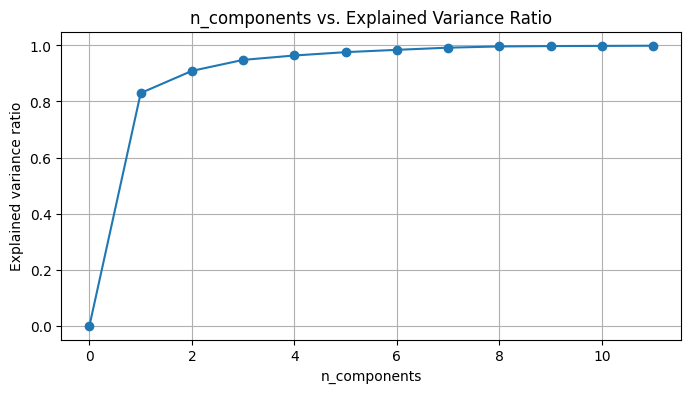

In [258]:
# Plotar visualização do explained_variance_ratio_ em função do número de componentes
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4),dpi=100)
plt.grid()
plt.plot(nums, var_ratio, marker='o')
plt.xlabel('n_components')
plt.ylabel('Explained variance ratio')
plt.title('n_components vs. Explained Variance Ratio')

In [259]:
# printando o valor de variância para n_components = 6 
print(f'A porcentagem de variância para n_components=6: {(var_ratio[5]*100):.2f}%')

A porcentagem de variância para n_components=6: 97.61%


> **Conclusão**: É notório que - segundo o gráfico acima - a partir de ***n_components=6*** há uma captura de variância de cerca de 97.6%. Mediante ao dado apresentado, será aplicado um PCA de ***n_components=6***, considerando, portanto, 6 variáveis dentro da base de dados em questão como mais prioritárias!

In [261]:
# Seletor de atributos por filtro
from sklearn.feature_selection import SelectKBest, mutual_info_classif

# Aplicando um filtro com k=4
selector = SelectKBest(score_func=mutual_info_classif, k=4)
X_reduced = selector.fit_transform(X,y)
X_reduced

array([[-63.189443, -47.864704, -73.010381, -49.583755],
       [-63.340003, -48.313132, -72.360239, -49.473893],
       [-62.837371, -48.384219, -63.127903, -48.08363 ],
       ...,
       [-53.300911, -42.289221, -48.94703 , -42.896321],
       [-53.601503, -42.527074, -48.618126, -42.420583],
       [-53.697702, -42.686179, -48.344164, -41.96982 ]])

### Separando os dados

In [262]:
# Bibliotecas
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import MinMaxScaler

In [263]:
# Separar os dados em conjuntos de treino e teste (usando X reduzido)
X_train, X_test, y_train, y_test = train_test_split(X_reduced, y, test_size=0.3, random_state=42)

### Algoritmos

### ***k-NN***

#### Analisando o melhor parâmetro com maior acurácia

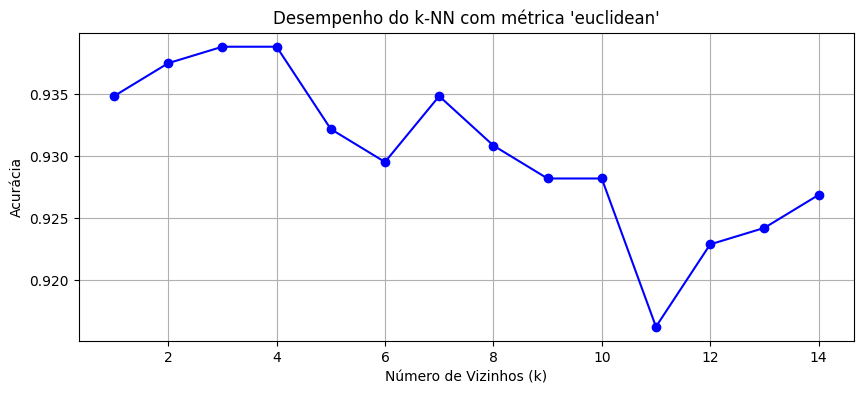

In [269]:
# Função para treinar e testar o modelo k-NN com diferentes valores de k e gerar relatórios de métricas

# Normalizando os dados com MinMaxScaler (normalização para o intervalo [0, 1])
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train) # ajustar a escala e transformar os dados
X_test_scaled = scaler.transform(X_test) # transformar os dados com a escala já ajustada com os dados treino

def knn_comparativo_com_metricas(k_values, metric='euclidean'):
    accuracy_results = []
    
    for k in k_values:
        # Criando o modelo k-NN
        knn = KNeighborsClassifier(n_neighbors=k, metric=metric)
        
        # Treinando o modelo
        knn.fit(X_train_scaled, y_train)
        
        # Fazendo previsões
        y_pred = knn.predict(X_test_scaled)
        
        # Calculando a acurácia
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_results.append(accuracy)
    

    # Plotando a acurácia para diferentes valores de k
    plt.figure(figsize=(10, 4))
    plt.plot(k_values, accuracy_results, marker='o', linestyle='-', color='b')
    plt.title(f"Desempenho do k-NN com métrica '{metric}'")
    plt.xlabel("Número de Vizinhos (k)")
    plt.ylabel("Acurácia")
    plt.grid(True)
    plt.show()


# Testando o k-NN com diferentes valores de k
k_values = list(range(1, 15))
knn_comparativo_com_metricas(k_values)


> **Conclusão**: Para k = 4, há a maior acurácia registrada para o uso do algoritmo k-NN

### Curva de aprendizado: k-NN

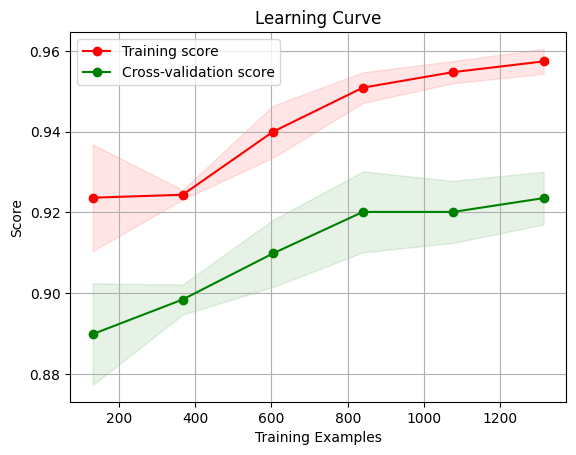

In [270]:
# Curva de aprendizado de k-NN
def plot_learning_curve(estimator, X, y, cv=None, train_sizes=np.linspace(0.1, 1.0, 6)):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, train_sizes=train_sizes, scoring='accuracy', n_jobs=-1
    )
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.figure()
    plt.title("Learning Curve")
    plt.xlabel("Training Examples")
    plt.ylabel("Score")
    
    plt.grid()
    
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    
    plt.legend(loc="best")
    return plt


# Modelo k-NN com k = 4
knn = KNeighborsClassifier(n_neighbors=4, metric='euclidean')

# Plotando a curva
plot_learning_curve(knn, X_train_scaled, y_train, cv=4)
plt.show()

### Report: k-NN

In [271]:
# Treinando o modelo
knn.fit(X_train_scaled, y_train)

# Fazendo previsões
y_pred = knn.predict(X_test_scaled)

In [272]:
# Imprimindo o relatório de métricas
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred))

Relatório de Classificação:
              precision    recall  f1-score   support

         0.0       0.83      0.88      0.86       155
         1.0       1.00      1.00      1.00       144
         2.0       1.00      0.99      1.00       152
         3.0       0.88      0.83      0.85       158
         4.0       1.00      1.00      1.00       143

    accuracy                           0.94       752
   macro avg       0.94      0.94      0.94       752
weighted avg       0.94      0.94      0.94       752



### Matriz de Confusão: k-NN

Matriz de Confusão:
[[137   0   0  18   0]
 [  0 144   0   0   0]
 [  1   0 151   0   0]
 [ 27   0   0 131   0]
 [  0   0   0   0 143]]


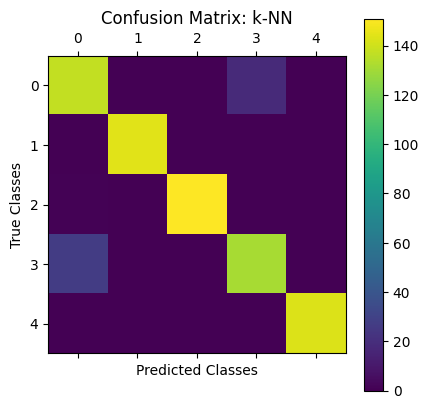

In [273]:
# Imprimindo a matriz
print("Matriz de Confusão:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

plt.matshow(cm)
plt.title('Confusion Matrix: k-NN')
plt.colorbar()
plt.ylabel('True Classes')
plt.xlabel('Predicted Classes')
plt.show()

### Curva ROC: k-NN

In [274]:
# Imprimindo a curva ROC
# Fazer previsões de probabilidade no conjunto de teste
# y_probs_knn = knn.predict_proba(X_test_scaled)[:, 1]

# Calculando a curva ROC e a AUC
# fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test, y_probs_knn)
# roc_auc_knn = roc_auc_score(y_test, y_probs_knn)

# # Plotar a curva ROC
# plt.figure(figsize=(10, 7))

# plt.plot(fpr_knn, tpr_knn, color='blue', lw=2, label='(AUC = %0.3f)' % roc_auc_knn)
# plt.plot([0, 1], [0, 1], linestyle='--', color='gray')

   
# # Marcar cada ponto gerado e exibir os limiares
# for i, threshold in enumerate(thresholds_knn):
#     plt.scatter(fpr_knn[i], tpr_knn[i], marker='o', color='red')
#     plt.text(fpr_knn[i], tpr_knn[i], f'{threshold:.2f}', fontsize=8, ha='left', va='bottom')


# plt.xlabel('Taxa de Falsos Positivos (FPR)')
# plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')
# plt.title('Curva ROC com Limiar Indicado nos Pontos: k-NN = 10')
# # plt.legend(['knn = 10'])
# plt.grid(True)
# plt.show()

Curva ROC necessita de somente um parâmetro para ser plotado. No seguinte projeto, estamos utilizando acima 4 parâmetros, portanto estamos impossibilitado momentaneamente de utilizar a curva ROC.

### ***Decision-Tree***



In [275]:
# Importando biblioteca
from sklearn.tree import DecisionTreeClassifier


In [276]:
# Criar classificador DecisionTree
dtc = DecisionTreeClassifier(random_state=42)

# Treinar modelo
dtc.fit(X_train_scaled, y_train)


DecisionTreeClassifier(random_state=42)

### Curva de Aprendizado: Decision Tree

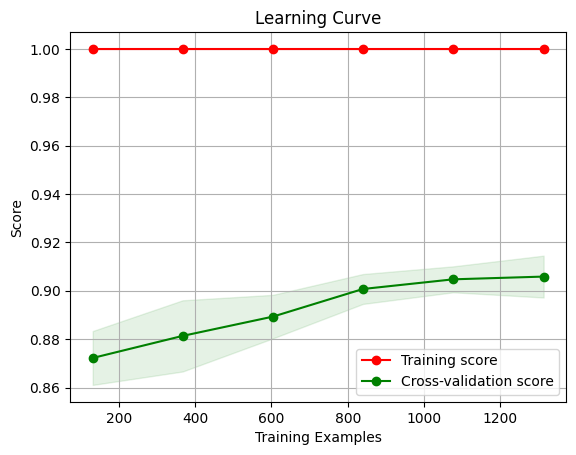

In [277]:
# Plotando a curva
plot_learning_curve(dtc, X_train_scaled, y_train, cv=4)
plt.show()

### Report: Decision-Tree

In [278]:
# Fazer previsões de classes no conjunto de teste
y_pred_dtc = dtc.predict(X_test_scaled)


# Imprimindo o relatório de métricas
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred_dtc))

Relatório de Classificação:
              precision    recall  f1-score   support

         0.0       0.81      0.77      0.79       155
         1.0       1.00      1.00      1.00       144
         2.0       1.00      1.00      1.00       152
         3.0       0.79      0.82      0.80       158
         4.0       1.00      1.00      1.00       143

    accuracy                           0.91       752
   macro avg       0.92      0.92      0.92       752
weighted avg       0.92      0.91      0.91       752



### Matriz de Confusão: Decision-Tree

Matriz de Confusão:
[[120   0   0  35   0]
 [  0 144   0   0   0]
 [  0   0 152   0   0]
 [ 29   0   0 129   0]
 [  0   0   0   0 143]]


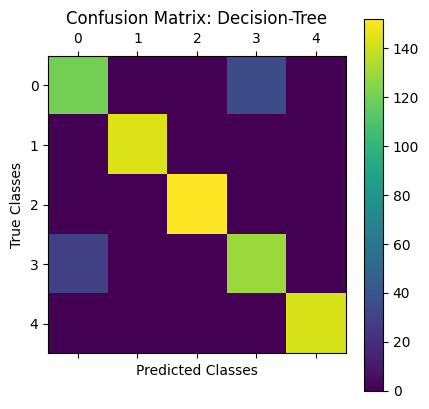

In [279]:
# Imprimindo a matriz
print("Matriz de Confusão:")
cm = confusion_matrix(y_test, y_pred_dtc)
print(cm)

plt.matshow(cm)
plt.title('Confusion Matrix: Decision-Tree')
plt.colorbar()
plt.ylabel('True Classes')
plt.xlabel('Predicted Classes')
plt.show()

### Curva ROC: Decision_Tree

In [251]:
# # Imprimindo a curva ROC

# # Fazer previsões de probabilidade no conjunto de teste
# y_probs_dtc = dtc.predict_proba(X_test_scaled)[:, 1]

# # Calculando a curva ROC e a AUC
# fpr_dtc, tpr_dtc, thresholds_dtc = roc_curve(y_test, y_probs_dtc)
# roc_auc_dtc = roc_auc_score(y_test, y_probs_dtc)

# # Plotar a curva ROC
# plt.figure(figsize=(10, 7))

# plt.plot(fpr_dtc, tpr_dtc, color='blue', lw=2, label='(AUC = %0.3f)' % roc_auc_dtc)
# plt.plot([0, 1], [0, 1], linestyle='--', color='gray')

   
# # Marcar cada ponto gerado e exibir os limiares
# for i, threshold in enumerate(thresholds_dtc):
#     plt.scatter(fpr_dtc[i], tpr_dtc[i], marker='o', color='red')
#     plt.text(fpr_dtc[i], tpr_dtc[i], f'{threshold:.2f}', fontsize=8, ha='left', va='bottom')


# plt.xlabel('Taxa de Falsos Positivos (FPR)')
# plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')
# plt.title('Curva ROC com Limiar Indicado nos Pontos: Decision-Tree')
# plt.legend(['Decision-Tree'])
# plt.grid(True)
# plt.show()

Justificativa do ROC acima no k-NN

### ***SVM***

In [252]:
# Bibliotecas
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from itertools import combinations

In [296]:
# Criando e treinando o modelo SVM linear
svm = SVC(kernel='linear', C=1)

# parâmetro C controla essa suavidade da margem:
# (i) valor alto de C penaliza mais as classificações erradas e tenta evitar erros de classificação, criando uma margem menor.
# (ii) valor baixo de C permite uma margem maior, permitindo que alguns pontos estejam do lado errado do hiperplano, 
#      mas generalizando melhor.

svm.fit(X_train_scaled, y_train)

SVC(C=1, kernel='linear')

### Curva de Aprendizado: SVM

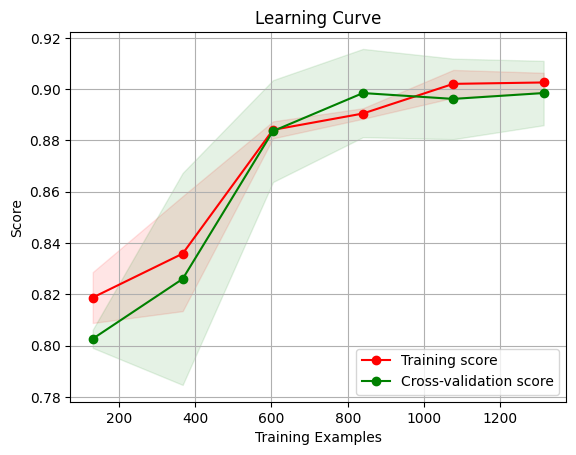

In [297]:
# Plotando a curva
plot_learning_curve(svm, X_train_scaled, y_train, cv=4)
plt.show()

### Report: SVM

In [298]:
# Fazer previsões de classes no conjunto de teste
y_pred_svm = svm.predict(X_test_scaled)


# Imprimindo o relatório de métricas
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred_dtc))

Relatório de Classificação:
              precision    recall  f1-score   support

         0.0       0.81      0.77      0.79       155
         1.0       1.00      1.00      1.00       144
         2.0       1.00      1.00      1.00       152
         3.0       0.79      0.82      0.80       158
         4.0       1.00      1.00      1.00       143

    accuracy                           0.91       752
   macro avg       0.92      0.92      0.92       752
weighted avg       0.92      0.91      0.91       752



### Matriz de Confusão: SVM

Matriz de Confusão:
[[119   0   0  36   0]
 [  0 144   0   0   0]
 [  0   0 152   0   0]
 [ 47   0   0 111   0]
 [  0   0   0   0 143]]


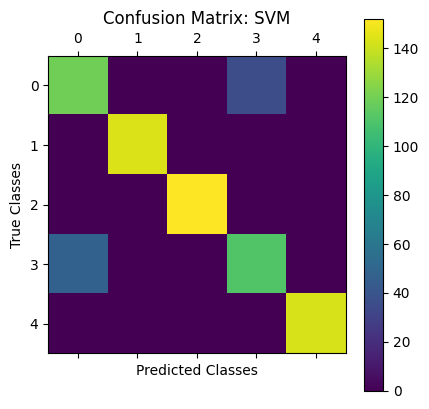

In [299]:
# Imprimindo a matriz
print("Matriz de Confusão:")
cm = confusion_matrix(y_test, y_pred_svm)
print(cm)

plt.matshow(cm)
plt.title('Confusion Matrix: SVM')
plt.colorbar()
plt.ylabel('True Classes')
plt.xlabel('Predicted Classes')
plt.show()